In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import torchvision

In [2]:
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())


PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124
CUDA is available: True


In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))   

In [4]:
image = cv2.imread('Dataset/Corner-kick/ck_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

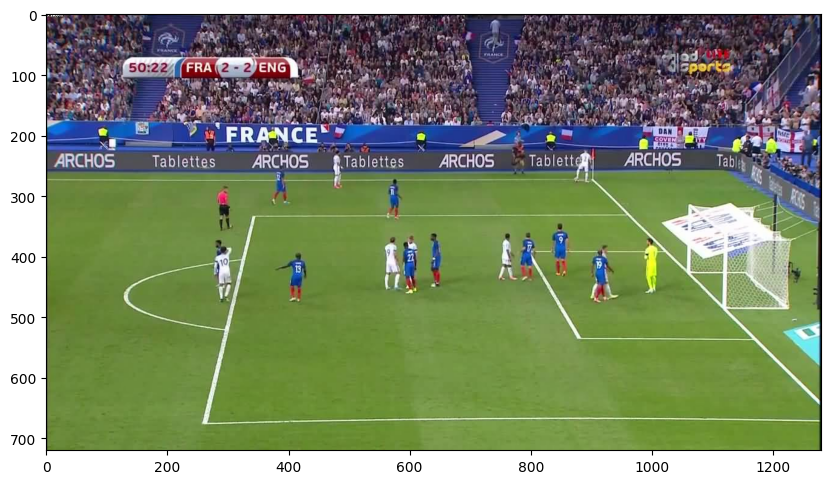

In [5]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [6]:

from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch

In [7]:
predictor.set_image(image)

In [8]:
image.shape

(720, 1280, 3)

In [9]:
input_point = np.array([[415, 420]])
input_label = np.array([1])

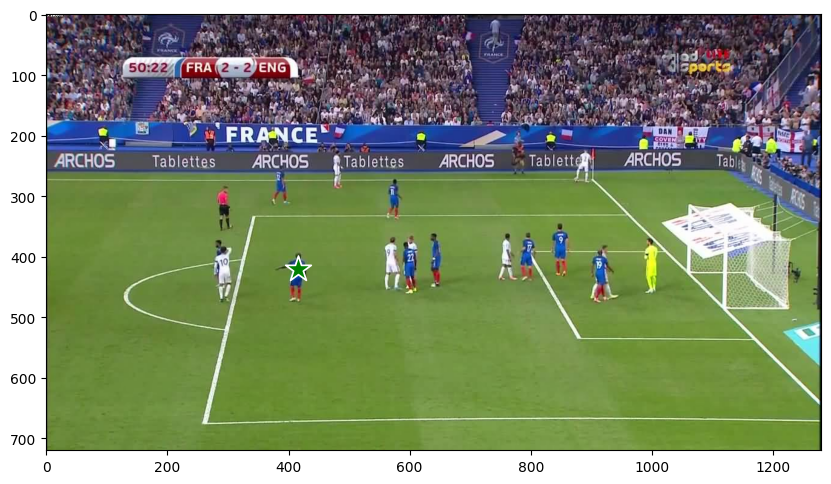

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [66]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

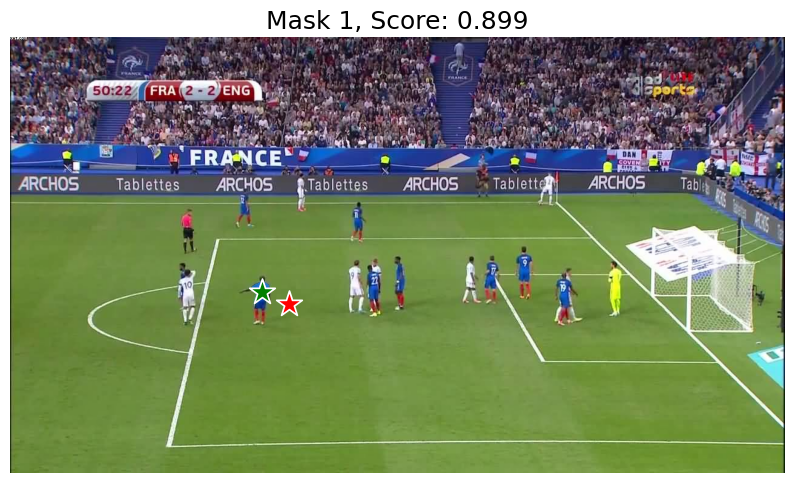

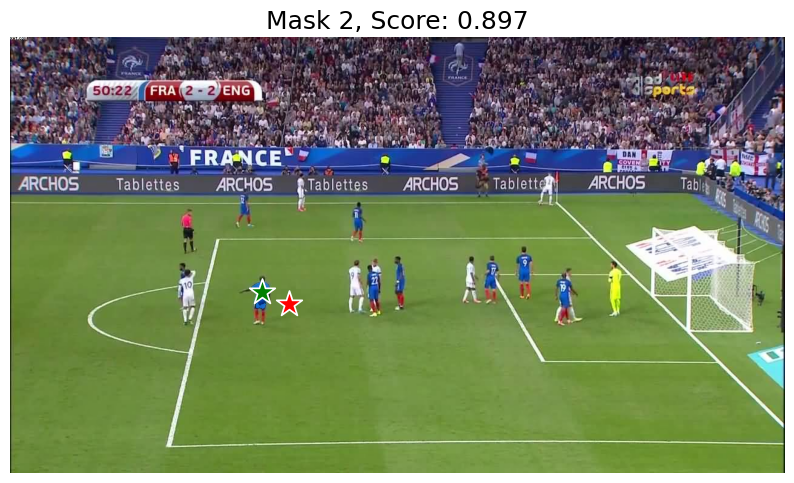

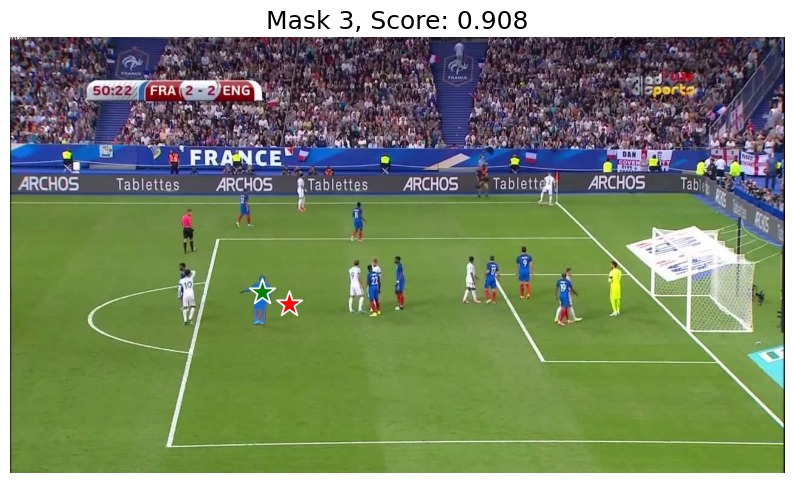

In [67]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

In [64]:
# 找到最佳 mask 的索引
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# 显示最佳 mask
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(best_mask, plt.gca())  # 只显示最高分的 mask
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()


IndexError: index 2 is out of bounds for axis 0 with size 1

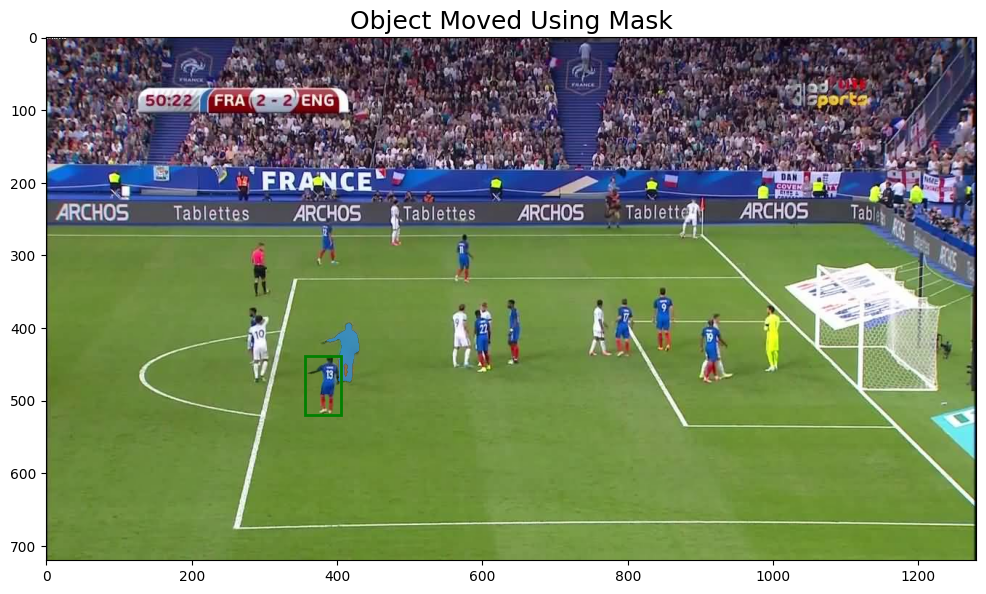

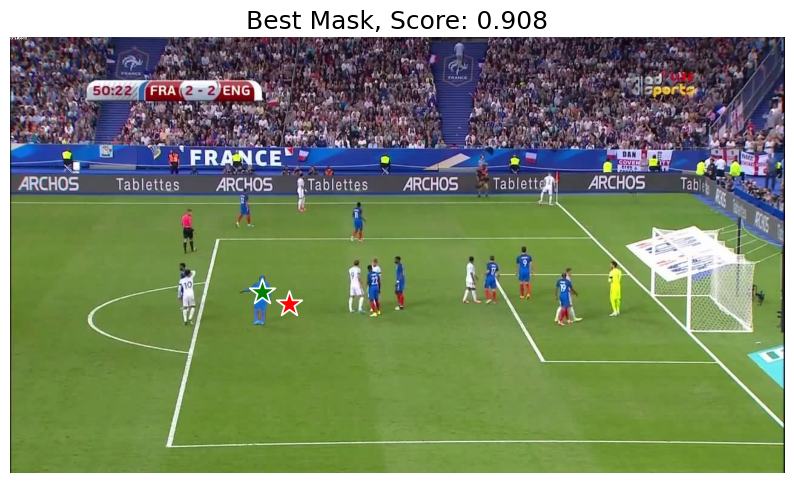

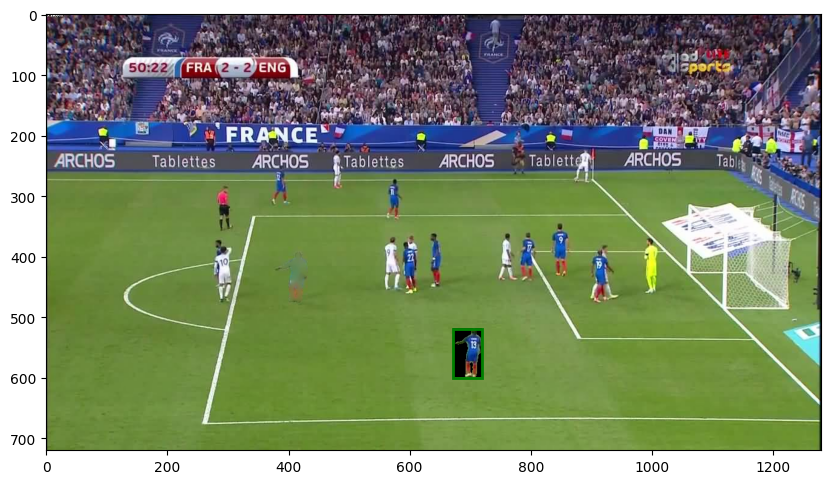

In [71]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def move_masked_object(image, mask, min_x=220, min_y=300):
    """ 
    仅移动 mask 覆盖的对象，而不是整个 bounding box，并修补原始位置 
    """
    image_moved = image.copy()

    # 1️⃣ 找到 mask 的边界范围
    y_indices, x_indices = np.where(mask > 0)
    if len(y_indices) == 0 or len(x_indices) == 0:
        raise ValueError("Mask is empty or incorrect.")

    y0, y1 = y_indices.min(), y_indices.max()
    x0, x1 = x_indices.min(), x_indices.max()

    # 计算对象尺寸
    object_height = y1 - y0
    object_width = x1 - x0

    # 2️⃣ 仅提取 mask 内的对象部分（不带背景）
    object_roi = np.zeros_like(image)
    for c in range(3):  # 遍历 RGB 通道
        object_roi[:, :, c] = image[:, :, c] * mask  # 仅保留 mask 部分

    # 3️⃣ 创建 inpainting 修补 mask（用于填补原位置）
    inpaint_mask = (mask * 255).astype(np.uint8)

    # 4️⃣ 使用 inpainting 修补原始区域
    image_without_object = cv2.inpaint(image_moved, inpaint_mask, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

    # 5️⃣ 生成随机新位置，确保不会超出边界
    new_x0 = np.random.randint(min_x, image.shape[1] - object_width)
    new_y0 = np.random.randint(min_y, image.shape[0] - object_height)
    new_x1, new_y1 = new_x0 + object_width, new_y0 + object_height

    # 6️⃣ 仅在新位置叠加 mask 内的对象（避免矩形裁剪问题）
    for c in range(3):  # 遍历 RGB 通道
        image_without_object[new_y0:new_y1, new_x0:new_x1, c] = object_roi[y0:y1, x0:x1, c] * mask[y0:y1, x0:x1]

    return image_without_object, np.array([new_x0, new_y0, new_x1, new_y1])

# 选择最佳 mask
best_mask_idx = np.argmax(scores)  # 最高分数的 mask 索引
best_mask = masks[best_mask_idx]   # 取最佳 mask
best_score = scores[best_mask_idx]

# 显示最佳 mask
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(best_mask, plt.gca())  # 显示最佳 mask
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# 处理 mask 移动
final_image, moved_box = move_masked_object(image, best_mask, min_x=220, min_y=300)

# 显示结果
plt.figure(figsize=(10, 10))
plt.imshow(final_image)
show_box(moved_box, plt.gca())  # 绘制新位置
plt.axis('on')
plt.show()


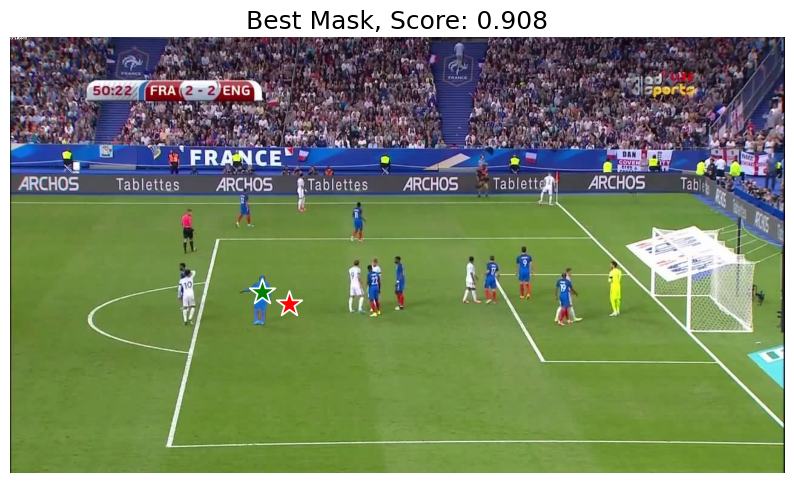

随机位移量 dx=414, dy=115


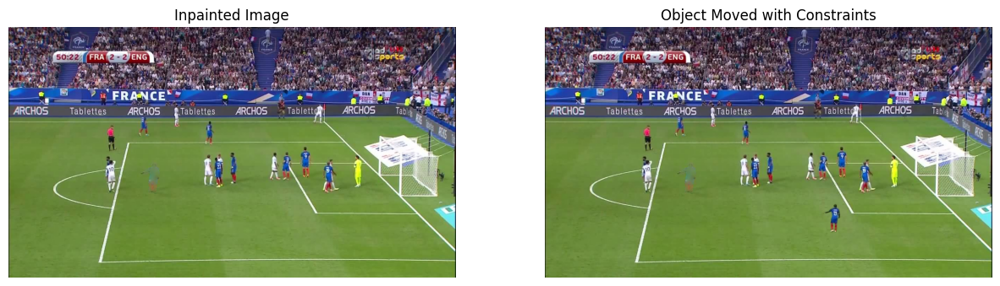

In [78]:
# ... （之前的代码，包括show_mask、show_points、show_box、加载图像、SAM模型初始化等）

# 找到最佳 mask 的索引
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# 显示最佳 mask
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(best_mask, plt.gca())
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# --- 新增部分：移动物体并修复原区域 ---
# 获取mask的坐标范围
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask区域为空")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# 计算有效位移范围
dx_min = 220 - min_x + 1
dx_max = (image_width - 1) - max_x
dx = np.random.randint(dx_min, dx_max + 1) if dx_min <= dx_max else 0

dy_min = 300 - min_y + 1
dy_max = (image_height - 1) - max_y
dy = np.random.randint(dy_min, dy_max + 1) if dy_min <= dy_max else 0

print(f"随机位移量 dx={dx}, dy={dy}")

# 修复原区域
mask_uint8 = best_mask.astype(np.uint8) * 255
image_inpainted = cv2.inpaint(image, mask_uint8, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

# 移动物体到新位置
y_indices_new = y_indices + dy
x_indices_new = x_indices + dx

# 过滤有效坐标
valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
y_valid = y_indices_new[valid]
x_valid = x_indices_new[valid]

# 创建结果图像
result = image_inpainted.copy()
result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# 显示最终结果
plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(image_inpainted)
plt.title("Inpainted Image")
plt.axis('off')

plt.subplot(122)
plt.imshow(result)
plt.title("Object Moved with Constraints")
plt.axis('off')

plt.show()

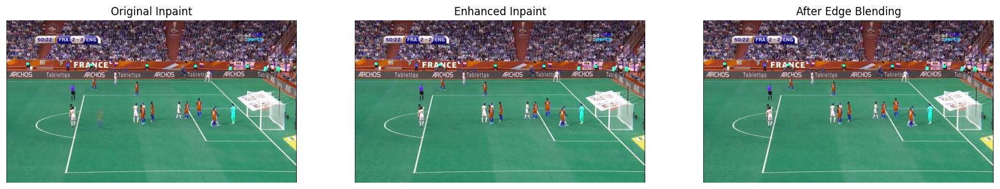

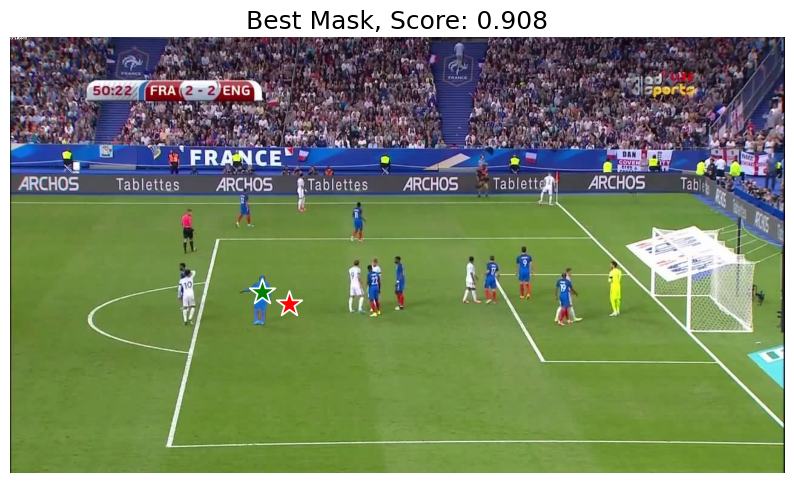

随机位移量 dx=551, dy=-62


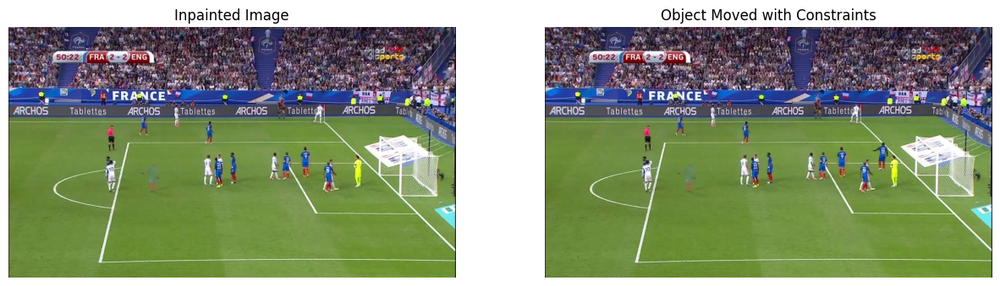

In [79]:
# 使用膨胀后的mask扩大修复范围
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
dilated_mask = cv2.dilate(best_mask.astype(np.uint8), kernel, iterations=2)

# 双重修复策略（先TELEA后NS）
image_inpainted = cv2.inpaint(image, dilated_mask*255, inpaintRadius=15, flags=cv2.INPAINT_TELEA)
image_inpainted = cv2.inpaint(image_inpainted, dilated_mask*255, inpaintRadius=10, flags=cv2.INPAINT_NS)

# 添加边缘混合处理
def blend_edges(img, mask, blur_size=5):
    # 创建渐变蒙版
    blurred_mask = cv2.GaussianBlur(mask.astype(np.float32), (blur_size, blur_size), 0)
    blended = img.copy()
    
    # 混合原始图像和修复图像
    for c in range(3):
        blended[:,:,c] = (
            img[:,:,c] * (1 - blurred_mask) + 
            image_inpainted[:,:,c] * blurred_mask
        )
    return blended.astype(np.uint8)

# 应用混合
final_result = blend_edges(image, dilated_mask)

# 可视化对比
plt.figure(figsize=(20, 10))

plt.subplot(131)
plt.imshow(cv2.cvtColor(cv2.inpaint(image, best_mask.astype(np.uint8)*255, 10, cv2.INPAINT_TELEA), cv2.COLOR_BGR2RGB))
plt.title("Original Inpaint")
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(image_inpainted, cv2.COLOR_BGR2RGB))
plt.title("Enhanced Inpaint")
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
plt.title("After Edge Blending")
plt.axis('off')

plt.show()

# 找到最佳 mask 的索引
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]
best_score = scores[best_mask_idx]

# 显示最佳 mask
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(best_mask, plt.gca())
show_points(input_point, input_label, plt.gca())  
plt.title(f"Best Mask, Score: {best_score:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# --- 新增部分：移动物体并修复原区域 ---
# 获取mask的坐标范围
y_indices, x_indices = np.where(best_mask)
if len(x_indices) == 0 or len(y_indices) == 0:
    raise ValueError("Mask区域为空")

min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)
image_height, image_width = image.shape[:2]

# 计算有效位移范围
dx_min = 220 - min_x + 1
dx_max = (image_width - 1) - max_x
dx = np.random.randint(dx_min, dx_max + 1) if dx_min <= dx_max else 0

dy_min = 300 - min_y + 1
dy_max = (image_height - 1) - max_y
dy = np.random.randint(dy_min, dy_max + 1) if dy_min <= dy_max else 0

print(f"随机位移量 dx={dx}, dy={dy}")

# 修复原区域
mask_uint8 = best_mask.astype(np.uint8) * 255
image_inpainted = cv2.inpaint(image, mask_uint8, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

# 移动物体到新位置
y_indices_new = y_indices + dy
x_indices_new = x_indices + dx

# 过滤有效坐标
valid = (x_indices_new >= 0) & (x_indices_new < image_width) & (y_indices_new >= 0) & (y_indices_new < image_height)
y_valid = y_indices_new[valid]
x_valid = x_indices_new[valid]

# 创建结果图像
result = image_inpainted.copy()
result[y_valid, x_valid] = image[y_indices[valid], x_indices[valid]]

# 显示最终结果
plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(image_inpainted)
plt.title("Inpainted Image")
plt.axis('off')

plt.subplot(122)
plt.imshow(result)
plt.title("Object Moved with Constraints")
plt.axis('off')

plt.show()

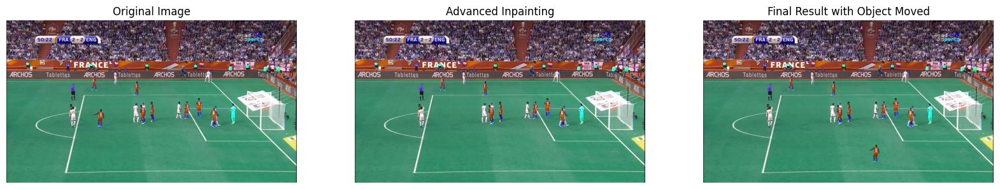

In [84]:
best_mask_idx = np.argmax(scores)
best_mask = masks[best_mask_idx]

# ------------------- 第二阶段：高级修复处理 -------------------
# 使用膨胀后的mask（关键改进）
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))  # 增大核尺寸
dilated_mask = cv2.dilate(best_mask.astype(np.uint8), kernel, iterations=3)

# 改进的双重修复策略
temp_inpaint = cv2.inpaint(image, dilated_mask*255, 20, cv2.INPAINT_TELEA)
final_inpainted = cv2.inpaint(temp_inpaint, dilated_mask*255, 15, cv2.INPAINT_NS)

# 边缘混合优化
def advanced_blending(orig, inpainted, mask, blur_size=9):
    blurred_mask = cv2.GaussianBlur(mask.astype(np.float32), (blur_size, blur_size), 0)
    blended = orig.copy()
    for c in range(3):
        blended[:,:,c] = orig[:,:,c]*(1-blurred_mask) + inpainted[:,:,c]*blurred_mask
    return blended.astype(np.uint8)

final_result = advanced_blending(image, final_inpainted, dilated_mask)

# ------------------- 第三阶段：物体移动处理 -------------------
# 计算位移参数
y_indices, x_indices = np.where(best_mask)
min_x, max_x = np.min(x_indices), np.max(x_indices)
min_y, max_y = np.min(y_indices), np.max(y_indices)

# 动态位移范围计算（确保新位置满足X>220,Y>300）
dx_range = (220 - min_x, image.shape[1] - max_x - 1)
dy_range = (300 - min_y, image.shape[0] - max_y - 1)

dx = np.random.randint(max(dx_range[0], 0), dx_range[1]+1) if dx_range[0] < dx_range[1] else 0
dy = np.random.randint(max(dy_range[0], 0), dy_range[1]+1) if dy_range[0] < dy_range[1] else 0

# 执行物体移动
result = final_result.copy()
valid = (x_indices+dx < image.shape[1]) & (y_indices+dy < image.shape[0])
result[y_indices[valid]+dy, x_indices[valid]+dx] = image[y_indices[valid], x_indices[valid]]

# ------------------- 可视化验证 -------------------
plt.figure(figsize=(20, 10))

plt.subplot(131)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
plt.title("Advanced Inpainting")
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Final Result with Object Moved")
plt.axis('off')

plt.show()

# Box 

In [13]:
input_box = np.array([375, 385, 435, 480])

In [14]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

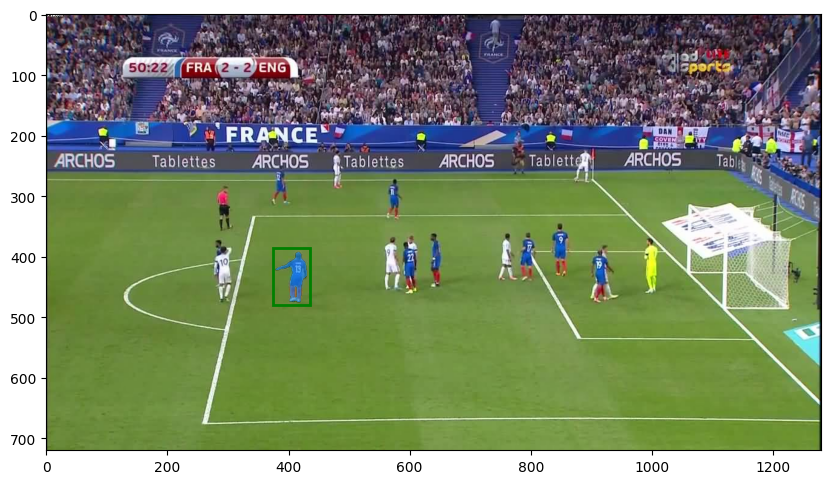

In [15]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('on')
plt.show()

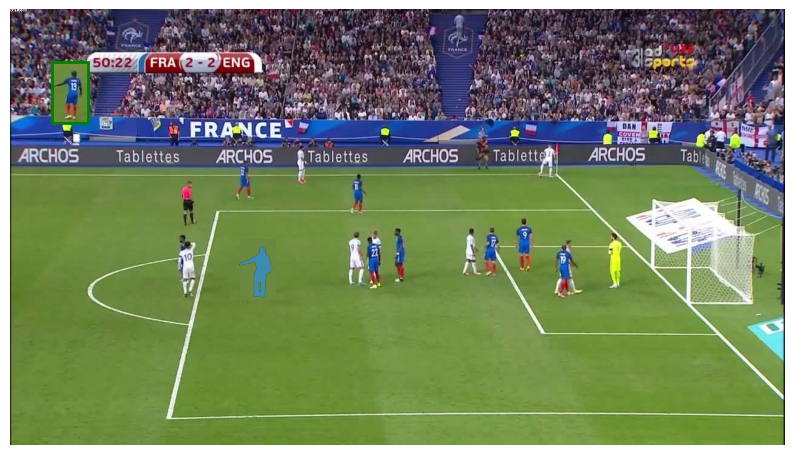

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Function to move the object and cover the original area with the surrounding environment
def move_object_and_cover_with_surrounding(image, input_box, max_offset=50, sample_area_size=50):
    x0, y0, x1, y1 = input_box
    # Extract the object (ROI) inside the bounding box
    object_roi = image[y0:y1, x0:x1]
    
    # Sample the color from a nearby area (around the original bounding box) to match the environment
    sample_x0 = max(0, x0 - sample_area_size)
    sample_y0 = max(0, y0 - sample_area_size)
    sample_x1 = min(image.shape[1], x1 + sample_area_size)
    sample_y1 = min(image.shape[0], y1 + sample_area_size)
    
    # Extract a sample area from the image
    sample_area = image[sample_y0:sample_y1, sample_x0:sample_x1]
    
    # Calculate the average color from the sampled area (mean of pixels)
    surrounding_color = np.mean(sample_area, axis=(0, 1)).astype(np.uint8)
    
    # Create a copy of the image and cover the original area with the surrounding color
    image_with_surrounding = image.copy()
    image_with_surrounding[y0:y1, x0:x1] = surrounding_color
    
    # Randomly choose a new position for the object inside the image bounds
    new_x0 = np.random.randint(0, image.shape[1] - (x1 - x0))
    new_y0 = np.random.randint(0, image.shape[0] - (y1 - y0))
    
    # Define the new bounding box for the object
    new_x1 = new_x0 + (x1 - x0)
    new_y1 = new_y0 + (y1 - y0)
    
    # Place the object at the new location on the image
    image_with_surrounding[new_y0:new_y1, new_x0:new_x1] = object_roi
    
    return image_with_surrounding, np.array([new_x0, new_y0, new_x1, new_y1])

# Specify your original input box
input_box = np.array([380, 380, 440, 480])

# Perform prediction using the input box
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

# Move the object inside the bounding box and cover original position with surrounding color
moved_image, moved_box = move_object_and_cover_with_surrounding(image, input_box, max_offset=50)

# Plot the image and visualize the moved object and the new bounding box
plt.figure(figsize=(10, 10))
plt.imshow(moved_image)
show_mask(masks[0], plt.gca())
show_box(moved_box, plt.gca())  # Show the moved bounding box
plt.axis('off')
plt.show()


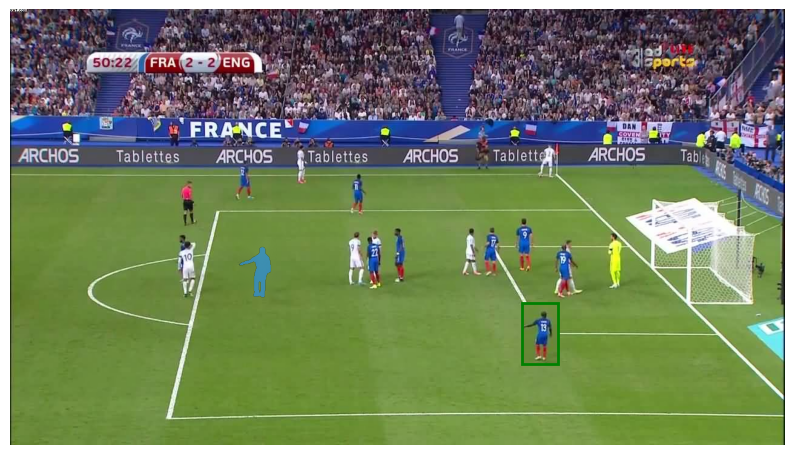

In [17]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to move the object and use surrounding pixels to fill the removed region
def move_object_and_inpaint(image, input_box, max_offset=50):
    x0, y0, x1, y1 = input_box
    object_roi = image[y0:y1, x0:x1]  # Extract the object (ROI)

    # Create a mask where the object was
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    mask[y0:y1, x0:x1] = 255  # Mark the object region for inpainting

    # Inpaint the masked area using nearby pixels
    image_inpainted = cv2.inpaint(image, mask, inpaintRadius=5, flags=cv2.INPAINT_TELEA)

    # Randomly choose a new position for the object
    new_x0 = np.random.randint(0, image.shape[1] - (x1 - x0))
    new_y0 = np.random.randint(0, image.shape[0] - (y1 - y0))

    # Define new bounding box
    new_x1, new_y1 = new_x0 + (x1 - x0), new_y0 + (y1 - y0)

    # Place the object at the new location
    image_inpainted[new_y0:new_y1, new_x0:new_x1] = object_roi

    return image_inpainted, np.array([new_x0, new_y0, new_x1, new_y1])

# Specify the original input box
input_box = np.array([380, 380, 440, 480])

# Perform prediction using the input box
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

# Move the object and inpaint the original area
moved_image, moved_box = move_object_and_inpaint(image, input_box, max_offset=50)

# Display the results
plt.figure(figsize=(10, 10))
plt.imshow(moved_image)
show_mask(masks[0], plt.gca())
show_box(moved_box, plt.gca())  # Show the new bounding box
plt.axis('off')
plt.show()


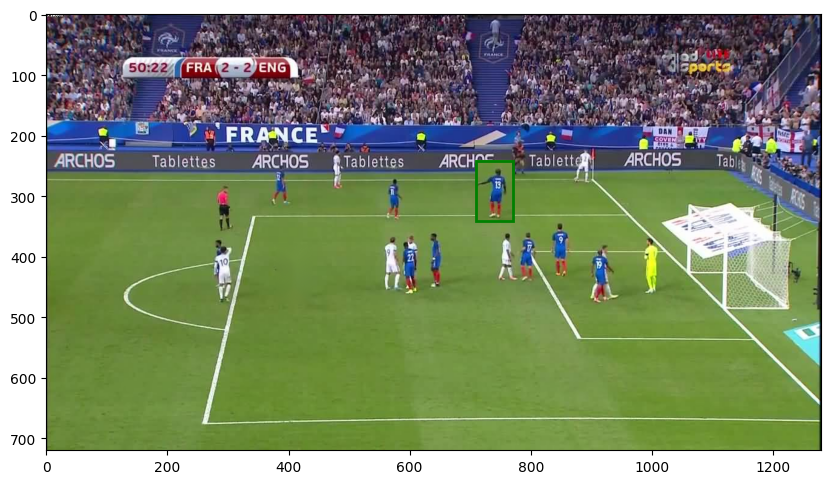

In [18]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to move an object and remove it from its original position using inpainting
def move_object_and_remove_original(image, input_box, max_offset=50):
    x0, y0, x1, y1 = input_box
    object_roi = image[y0:y1, x0:x1].copy()  # Extract the object (player)

    # Create a mask for the object’s original position
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    mask[y0:y1, x0:x1] = 255  # White region where the object was

    # Inpaint (fill) the original region using surrounding pixels
    image_without_object = cv2.inpaint(image, mask, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

    # Randomly choose a new position for the object inside the image bounds
    new_x0 = np.random.randint(0, image.shape[1] - (x1 - x0))
    new_y0 = np.random.randint(0, image.shape[0] - (y1 - y0))

    # Define new bounding box
    new_x1, new_y1 = new_x0 + (x1 - x0), new_y0 + (y1 - y0)

    # Place the object at the new location
    image_without_object[new_y0:new_y1, new_x0:new_x1] = object_roi

    return image_without_object, np.array([new_x0, new_y0, new_x1, new_y1])

# Specify the original input box
input_box = np.array([380, 380, 440, 480])

# Perform prediction using the input box
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

# Move the object and remove it from its original position
final_image, moved_box = move_object_and_remove_original(image, input_box, max_offset=50)

# Display the results
plt.figure(figsize=(10, 10))
plt.imshow(final_image)
show_box(moved_box, plt.gca())  # Show the new bounding box
plt.axis('on')
plt.show()


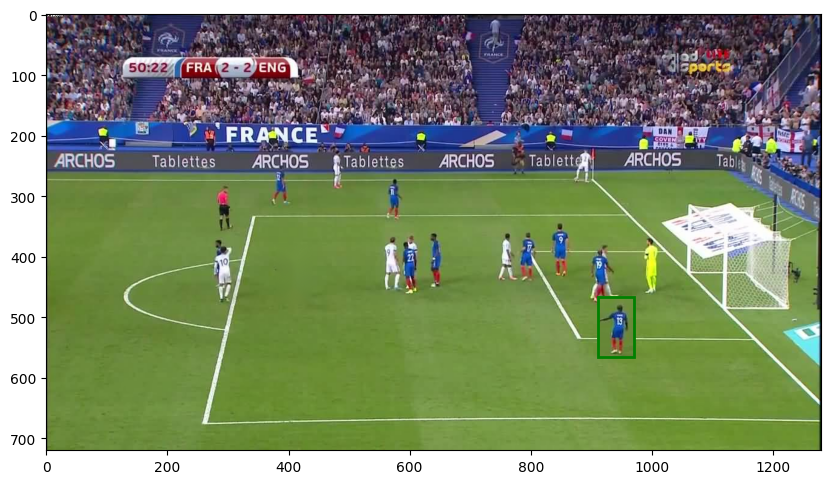

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to move an object and remove it from its original position using inpainting
def move_object_and_remove_original(image, input_box, max_offset=50, min_x=220, min_y=300):
    x0, y0, x1, y1 = input_box
    object_roi = image[y0:y1, x0:x1].copy()  # Extract the object (player)

    # Create a mask for the object's original position
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    mask[y0:y1, x0:x1] = 255  # White region where the object was

    # Inpaint (fill) the original region using surrounding pixels
    image_without_object = cv2.inpaint(image, mask, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

    # Ensure the new position respects the constraints
    object_width = x1 - x0
    object_height = y1 - y0

    # Define new_x0 and new_y0 within valid range
    new_x0 = np.random.randint(min_x, image.shape[1] - object_width)
    new_y0 = np.random.randint(min_y, image.shape[0] - object_height)

    # Define new bounding box
    new_x1, new_y1 = new_x0 + object_width, new_y0 + object_height

    # Place the object at the new location
    image_without_object[new_y0:new_y1, new_x0:new_x1] = object_roi

    return image_without_object, np.array([new_x0, new_y0, new_x1, new_y1])

# Specify the original input box
input_box = np.array([380, 380, 440, 480])

# Perform prediction using the input box
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

# Move the object with position constraints (X > 220, Y > 300)
final_image, moved_box = move_object_and_remove_original(image, input_box, max_offset=50, min_x=220, min_y=300)

# Display the results
plt.figure(figsize=(10, 10))
plt.imshow(final_image)
show_box(moved_box, plt.gca())  # Show the new bounding box
plt.axis('on')
plt.show()


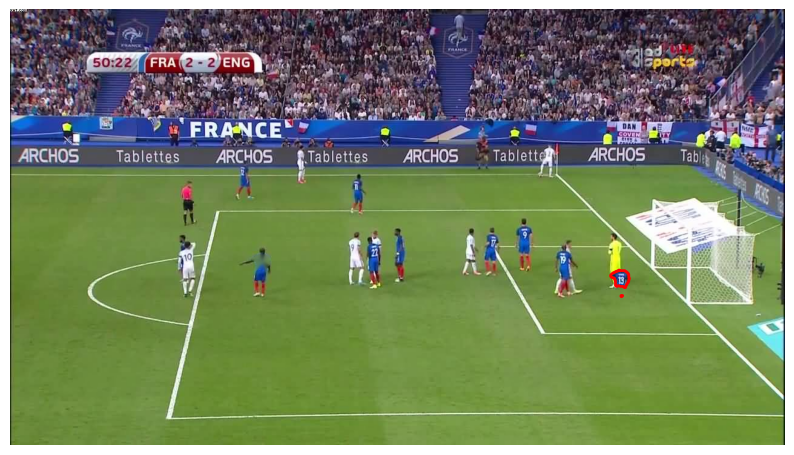

In [22]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to move an object based on mask and remove it from the original position
def move_object_and_remove_original(image, mask, max_offset=50, min_x=220, min_y=300):
    # Get bounding box of the mask
    y_indices, x_indices = np.where(mask > 0)
    x0, y0, x1, y1 = min(x_indices), min(y_indices), max(x_indices), max(y_indices)

    # Extract the object using the mask
    object_roi = np.zeros_like(image)
    object_roi[mask > 0] = image[mask > 0]  # Extract only masked region

    # Create an inpainting mask (white pixels where the object was)
    inpaint_mask = (mask > 0).astype(np.uint8) * 255

    # Inpaint the original region using surrounding pixels
    image_without_object = cv2.inpaint(image, inpaint_mask, inpaintRadius=10, flags=cv2.INPAINT_TELEA)

    # Ensure the new position respects constraints
    object_width, object_height = x1 - x0, y1 - y0
    new_x0 = np.random.randint(min_x, image.shape[1] - object_width)
    new_y0 = np.random.randint(min_y, image.shape[0] - object_height)

    # Compute new bounding box
    new_x1, new_y1 = new_x0 + object_width, new_y0 + object_height

    # Compute the shift
    dx, dy = new_x0 - x0, new_y0 - y0

    # Shift the mask
    moved_mask = np.zeros_like(mask)
    new_y_indices = np.clip(y_indices + dy, 0, mask.shape[0] - 1)
    new_x_indices = np.clip(x_indices + dx, 0, mask.shape[1] - 1)
    moved_mask[new_y_indices, new_x_indices] = mask[y_indices, x_indices]

    # Copy the object to the new location
    final_image = image_without_object.copy()
    valid_indices = np.where(moved_mask > 0)  # Get new object pixel locations
    final_image[valid_indices] = object_roi[y_indices, x_indices]

    return final_image, moved_mask

# Specify the input point
input_point = np.array([[415, 420]])
input_label = np.array([1])

# Predict the mask using SAM
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=None,  # No bounding box
    multimask_output=False
)

# Extract the first mask (assuming single object)
mask = masks[0]

# Move the object based on the detected mask
final_image, moved_mask = move_object_and_remove_original(image, mask, max_offset=50, min_x=220, min_y=300)

# Display results
plt.figure(figsize=(10, 10))
plt.imshow(final_image)
plt.contour(moved_mask, colors='red', linewidths=2)  # Show the new mask
plt.axis('off')
plt.show()
